In [3]:
import pandas as pd
from matplotlib.patches import Rectangle
import utils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import csv
import random
import os
import json
import math

In [1]:
#---------------------------------------------------
#
# Config *** TO UPDATE ***
#
#---------------------------------------------------

# *** TO UPDATE: change the team number with your own team number
TEAM_NUMBER = "team3"

# Gaze data File
GAZE_DATA_FILE = "raw-data/"+TEAM_NUMBER+"/gaze data/data.csv"

# File with AOIS definitions 
AOIS_DEFINITION_FILE = "raw-data/"+TEAM_NUMBER+"/aois definitions/aois.csv"

# Path of the stimulus images for the different tasks 
STIMULUS_IMAGE_WITH_AOIS_PATH = "raw-data/"+TEAM_NUMBER+"/stimulus image with aois/"

# Numbers of rows with meta-data to skip when creating the dataframe
META_DATA_ROWS_IN_GAZE_DATA_FILE = 24

In [12]:
#----------------------------------------------------------------------------------------
#
#
# 1. Gaze Data import and computation of X and Y gaze coordinates
#
#
#----------------------------------------------------------------------------------------

In [13]:
#Read gaze data using pandas library
data = pd.read_csv(GAZE_DATA_FILE, skiprows=META_DATA_ROWS_IN_GAZE_DATA_FILE)
# set display.max_columns to none, to show all the columns when using head()
pd.set_option('display.max_columns', None)

In [14]:
# preview gaze data
data.head()

,Row,Respondent,Age,Gender,Group,Calibration,Timestamp,EventSource,SlideEvent,StimType,Duration,CollectionPhase,SourceStimuliName,EventSource.1,ET_GazeLeftx,ET_GazeLefty,ET_GazeRightx,ET_GazeRighty,ET_PupilLeft,ET_PupilRight,ET_TimeSignal,ET_DistanceLeft,ET_DistanceRight,ET_CameraLeftX,ET_CameraLeftY,ET_CameraRightX,ET_CameraRightY,ET_ValidityLeft,ET_ValidityRight
0,1,P1,0,OTHER,Default,Good,113.4082,1.0,StartSlide,TestImage,300000.0,StimuliDisplay,SWA_Stimulus,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,P1,0,OTHER,Default,Good,116.3702,NaN,NaN,NaN,NaN,NaN,SWA_Stimulus,1.0,888.0,515.0,1010.0,425.0,-1.000000,-1.000000,124.985,619.543823,642.581055,0.619945,0.423148,0.458277,0.416878,0.0,0.0
2,3,P1,0,OTHER,Default,Good,124.6983,NaN,NaN,NaN,NaN,NaN,SWA_Stimulus,1.0,888.0,515.0,1012.0,420.0,4.466522,4.194916,133.313,619.592834,642.683228,0.619940,0.423088,0.458230,0.416665,0.0,0.0
3,4,P1,0,OTHER,Default,Good,133.0560,NaN,NaN,NaN,NaN,NaN,SWA_Stimulus,1.0,902.0,491.0,1012.0,420.0,-1.000000,-1.000000,141.671,619.556641,642.699036,0.619840,0.423102,0.458169,0.416592,0.0,0.0
4,5,P1,0,OTHER,Default,Good,141.4015,NaN,NaN,NaN,NaN,NaN,SWA_Stimulus,1.0,900.0,497.0,1012.0,443.0,-1.000000,-1.000000,150.015,619.610413,642.775269,0.619859,0.422902,0.458232,0.416609,0.0,0.0


In [15]:
# Get the participants list
print(f'Participants list {data["Respondent"].unique()}')

Participants list ['P1' 'P2' 'P3']


In [16]:
# Get the tasks list
print(f'tasks list {data["SourceStimuliName"].unique()}')

tasks list ['SWA_Stimulus' 'SWA_Stimulus2']


In [18]:
# Replace -1 values with NaN
data = data.replace(-1,np.nan)

# compute the mean X and Y gaze positions based on the left and right eyes
data['GazeX'] = data[['ET_GazeLeftx','ET_GazeRightx']].mean(axis=1)
data['GazeY'] = data[['ET_GazeLefty','ET_GazeRighty']].mean(axis=1)

In [19]:

# preview gaze data with mean X and Y gaze positions columns
data.head()

,Row,Respondent,Age,Gender,Group,Calibration,Timestamp,EventSource,SlideEvent,StimType,Duration,CollectionPhase,SourceStimuliName,EventSource.1,ET_GazeLeftx,ET_GazeLefty,ET_GazeRightx,ET_GazeRighty,ET_PupilLeft,ET_PupilRight,ET_TimeSignal,ET_DistanceLeft,ET_DistanceRight,ET_CameraLeftX,ET_CameraLeftY,ET_CameraRightX,ET_CameraRightY,ET_ValidityLeft,ET_ValidityRight,GazeX,GazeY
0,1,P1,0,OTHER,Default,Good,113.4082,1.0,StartSlide,TestImage,300000.0,StimuliDisplay,SWA_Stimulus,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,P1,0,OTHER,Default,Good,116.3702,NaN,NaN,NaN,NaN,NaN,SWA_Stimulus,1.0,888.0,515.0,1010.0,425.0,NaN,NaN,124.985,619.543823,642.581055,0.619945,0.423148,0.458277,0.416878,0.0,0.0,949.0,470.0
2,3,P1,0,OTHER,Default,Good,124.6983,NaN,NaN,NaN,NaN,NaN,SWA_Stimulus,1.0,888.0,515.0,1012.0,420.0,4.466522,4.194916,133.313,619.592834,642.683228,0.619940,0.423088,0.458230,0.416665,0.0,0.0,950.0,467.5
3,4,P1,0,OTHER,Default,Good,133.0560,NaN,NaN,NaN,NaN,NaN,SWA_Stimulus,1.0,902.0,491.0,1012.0,420.0,NaN,NaN,141.671,619.556641,642.699036,0.619840,0.423102,0.458169,0.416592,0.0,0.0,957.0,455.5
4,5,P1,0,OTHER,Default,Good,141.4015,NaN,NaN,NaN,NaN,NaN,SWA_Stimulus,1.0,900.0,497.0,1012.0,443.0,NaN,NaN,150.015,619.610413,642.775269,0.619859,0.422902,0.458232,0.416609,0.0,0.0,956.0,470.0


In [20]:
#----------------------------------------------------------------------------------------
#
#
# 4. Data exploration and visual quality assessment
# Projecting gaze points on Areas of Interests (AOIs)
# 
#
#----------------------------------------------------------------------------------------

In [21]:
# Read file with AOI coordinates
""" Dataframe columns
AOI: name of the AOI
p1x: starting point of the AOI rectangle on the x axis
p1y: starting point of the AOI rectangle on the y axis
p2x: ending point of the AOI rectangle on the x axis
p2y: ending point of the AOI rectangle on the y axis
task: name of the task
"""
aois = pd.read_csv(AOIS_DEFINITION_FILE)

# Compute the width and the height of the AOIs based on their start/ending points
aois['width'] = aois['p2x']-aois['p1x']
aois['height'] = aois['p2y']-aois['p1y']

display(aois)

,AOI,p1x,p1y,p2x,p2y,task,width,height
0,SWA_Stimulus_Journalist_List_1,310.153846,201.538462,396.307692,328.307692,SWA_Stimulus,86.153846,126.769231
1,SWA_Stimulus_Status_invited1,412.307692,738.153846,468.923077,807.076923,SWA_Stimulus,56.615385,68.923077
2,SWA_Stimulus_Cancel_add,1601.230769,480.923077,1649.230769,519.076923,SWA_Stimulus,48.000000,38.153846
3,SWA_Stimulus_Add_1,804.923077,31.692308,875.076923,68.615385,SWA_Stimulus,70.153846,36.923077
4,SWA_Stimulus_Status_Request2,596.923077,738.153846,676.923077,767.692308,SWA_Stimulus,80.000000,29.538462
5,SWA_Stimulus_Navigation_2,131.692308,605.230769,247.384615,719.692308,SWA_Stimulus,115.692308,114.461538
6,SWA_Stimulus_Status_Published3,796.307692,207.692308,866.461538,272.923077,SWA_Stimulus,70.153846,65.230769
7,SWA_Stimulus_EventInfo_1,304.705882,74.117647,874.117647,196.470588,SWA_Stimulus,569.411765,122.352941
8,SWA_Stimulus_Confirm_add,1656.615385,482.153846,1716.923077,516.615385,SWA_Stimulus,60.307692,34.461538
9,SWA_Stimulus_Status_Published2,596.923077,199.076923,667.076923,272.923077,SWA_Stimulus,70.153846,73.846154


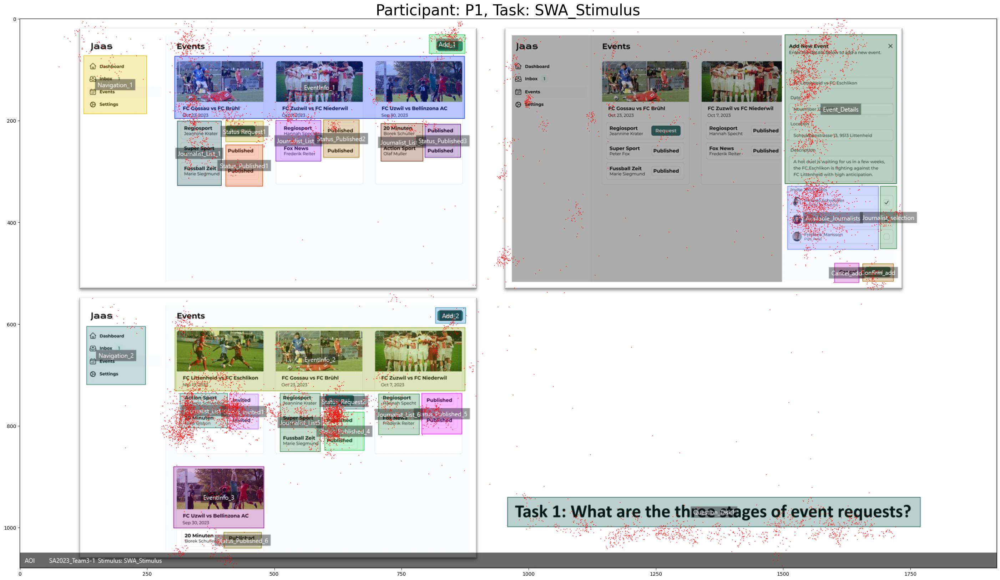

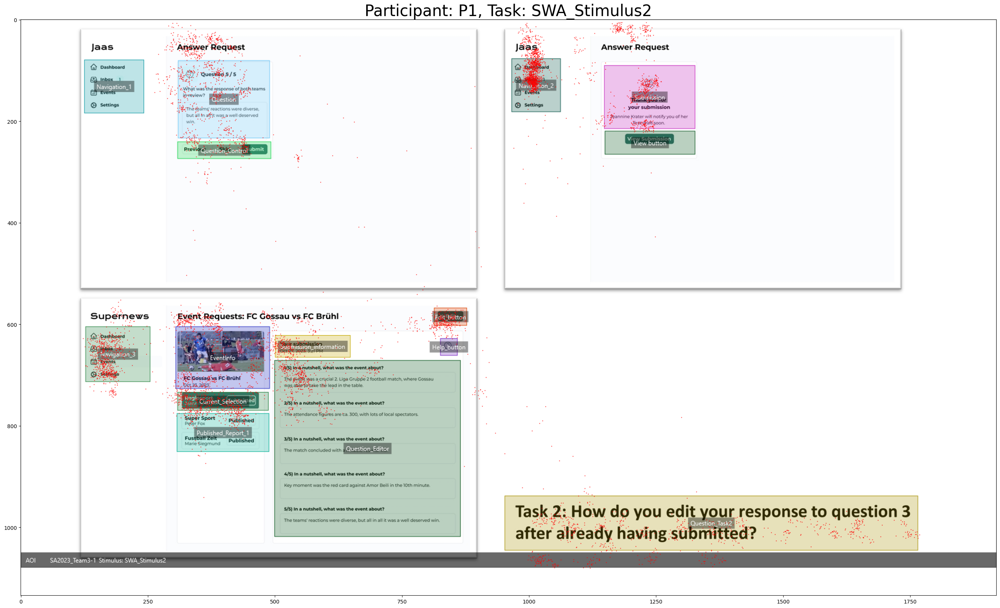

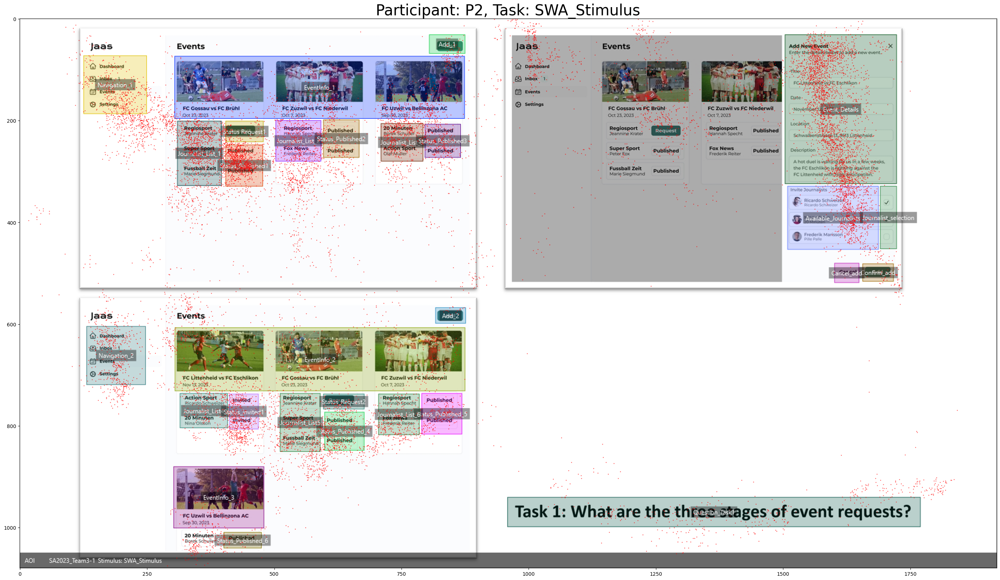

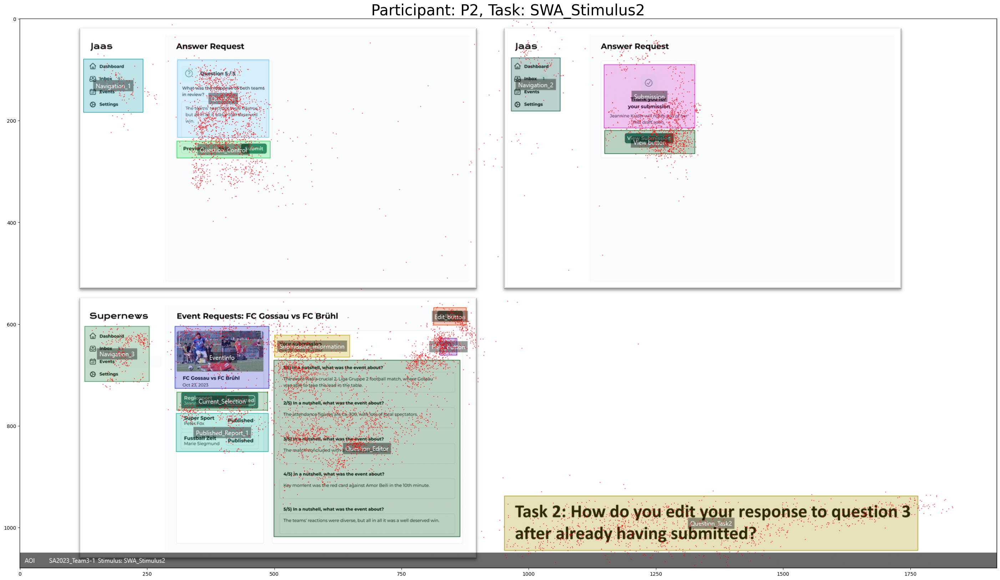

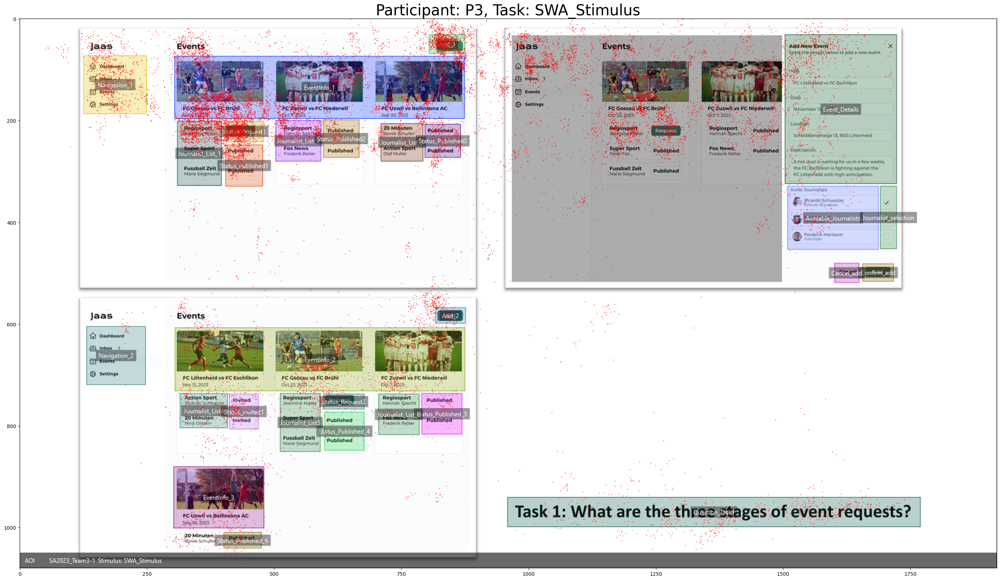

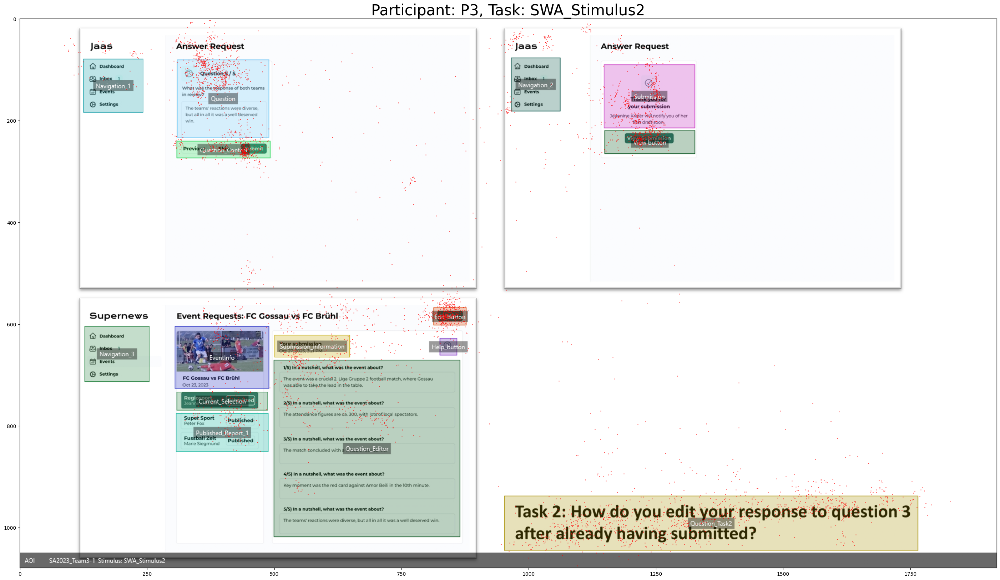

In [22]:
# Iteratate over the participants and tasks, then plot gazes and AOIs for each participant and task
for participant in data['Respondent'].unique():
    
    for task in data["SourceStimuliName"].unique():
        
        # Path to the stimulus image
        image_path = STIMULUS_IMAGE_WITH_AOIS_PATH+task+'.png'

        # filter in the participant and task data
        participantTaskData= data[(data['Respondent']==participant) & (data['SourceStimuliName']==task)]

        # Initiate a coordinate system with a background image
        fig, ax = utils.initPlotContainer(image_path)

        # set title
        ax.set_title(f'Participant: {participant}, Task: {task}', fontsize=30)

        # Plot gazes
        ax.plot(participantTaskData['GazeX'], participantTaskData['GazeY'],'o',alpha=0.5, markersize=1, color='red')

In [ ]:
#----------------------------------------------------------------------------------------
#
#
# 4. Assign gaze points to AOIs
#
#
#----------------------------------------------------------------------------------------

In [23]:
# copy gazeData to gazeDataWithAOIs
gazeDataWithAOIs = data.copy(deep=True)

# iterate over the rows in aois dataframe
for index, row in aois.iterrows():
    # get the name of AOI
    aoiName = row['AOI']
    # add a new column with key=aoiName and value=(0 or 1) depending on whether the gaze point in within the AOI in question 
    gazeDataWithAOIs[aoiName] = data.apply(lambda x : utils.pointInRect(x['SourceStimuliName'],x['GazeX'],x['GazeY'],row['task'],row['p1x'],row['p1y'],row['p2x'],row['p2y']),axis=1)

In [24]:
# preview gaze data with AOIs mapping
gazeDataWithAOIs.head()

,Row,Respondent,Age,Gender,Group,Calibration,Timestamp,EventSource,SlideEvent,StimType,Duration,CollectionPhase,SourceStimuliName,EventSource.1,ET_GazeLeftx,ET_GazeLefty,ET_GazeRightx,ET_GazeRighty,ET_PupilLeft,ET_PupilRight,ET_TimeSignal,ET_DistanceLeft,ET_DistanceRight,ET_CameraLeftX,ET_CameraLeftY,ET_CameraRightX,ET_CameraRightY,ET_ValidityLeft,ET_ValidityRight,GazeX,GazeY,SWA_Stimulus_Journalist_List_1,SWA_Stimulus_Status_invited1,SWA_Stimulus_Cancel_add,SWA_Stimulus_Add_1,SWA_Stimulus_Status_Request2,SWA_Stimulus_Navigation_2,SWA_Stimulus_Status_Published3,SWA_Stimulus_EventInfo_1,SWA_Stimulus_Confirm_add,SWA_Stimulus_Status_Published2,SWA_Stimulus_Journalist_List_6,SWA_Stimulus_Status_Published_6,SWA_Stimulus_Status_Published_5,SWA_Stimulus_Status Request1,SWA_Stimulus_EventInfo_2,SWA_Stimulus_Status_Published1,SWA_Stimulus_Journalist_List5,SWA_Stimulus_Question_Task1,SWA_Stimulus_Journalist_List4,SWA_Stimulus_EventInfo_3,SWA_Stimulus_Status_Published_4,SWA_Stimulus_Navigation_1,SWA_Stimulus_Journalist_selection,SWA_Stimulus_Event_Details,SWA_Stimulus_Journalist_List_3,SWA_Stimulus_Available_Journalists,SWA_Stimulus_Add_2,SWA_Stimulus_Journalist_List_2,SWA_Stimulus2_Current_Selection,SWA_Stimulus2_View button,SWA_Stimulus2_Navigation_2,SWA_Stimulus2_EventInfo,SWA_Stimulus2_Edit_button,SWA_Stimulus2_Submission_information,SWA_Stimulus2_Question_Task2,SWA_Stimulus2_Question,SWA_Stimulus2_Navigation_3,SWA_Stimulus2_Help_button,SWA_Stimulus2_Navigation_1,SWA_Stimulus2_Submission,SWA_Stimulus2_Question_Editor,SWA_Stimulus2_Published_Report_1,SWA_Stimulus2_Question_Control
0,1,P1,0,OTHER,Default,Good,113.4082,1.0,StartSlide,TestImage,300000.0,StimuliDisplay,SWA_Stimulus,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,P1,0,OTHER,Default,Good,116.3702,NaN,NaN,NaN,NaN,NaN,SWA_Stimulus,1.0,888.0,515.0,1010.0,425.0,NaN,NaN,124.985,619.543823,642.581055,0.619945,0.423148,0.458277,0.416878,0.0,0.0,949.0,470.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,3,P1,0,OTHER,Default,Good,124.6983,NaN,NaN,NaN,NaN,NaN,SWA_Stimulus,1.0,888.0,515.0,1012.0,420.0,4.466522,4.194916,133.313,619.592834,642.683228,0.619940,0.423088,0.458230,0.416665,0.0,0.0,950.0,467.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,4,P1,0,OTHER,Default,Good,133.0560,NaN,NaN,NaN,NaN,NaN,SWA_Stimulus,1.0,902.0,491.0,1012.0,420.0,NaN,NaN,141.671,619.556641,642.699036,0.619840,0.423102,0.458169,0.416592,0.0,0.0,957.0,455.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,5,P1,0,OTHER,Default,Good,141.4015,NaN,NaN,NaN,NaN,NaN,SWA_Stimulus,1.0,900.0,497.0,1012.0,443.0,NaN,NaN,150.015,619.610413,642.775269,0.619859,0.422902,0.458232,0.416609,0.0,0.0,956.0,470.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [25]:
# export gazeDataWithAOIs as csv
gazeDataWithAOIs.to_csv('data/gazeDataWithAOIs.csv',  index=False)